**SEGUNDA PRE ENTREGA PROYECTO FINAL - CURSO DATA SCIENCE - OBTENCION DE INSIGHTS A PARTIR DE VISUALIZACIONES - COMISION 46275 - ALUMNO JUAN JOSE CARREON**

##### **Contexto empresarial**

La empresa que administra en Argentina el MEM (CAMMESA) debe asegurar el correcto suministro de energía de acuerdo a todas las necesidades de los usuarios pero dado el progresivo cambio climático producto del uso de combustibles fósiles exige que lo que se genera sea consistentemente responsable desde el punto de vista medioambiental.

En base a esto se quiere entender como se comporta el segmento de GENERACIÓN del MEM, y para ello CAMMESA suministra mensualmente datos de generación de energía en megavatioshora (MWh) y emisiones de gases de efecto invernadero en toneladas de CO2. En este caso los datos disponibles son mensuales y van desde Enero del 2020 hasta Julio del 2023 inclusive.

Desde el área de data de CAMMESA se necesita contruir visualizaciones que permitan identificar patrones en los datos, para ayudar en la definición políticas y acciones para el sector energético que busquen orientar a las provincias en el uso más eficiente de los recursos disponibles.

Los datos mensuales disponibles contienen, además de las mediciónes de generación y emisión, caracteristicas tales como agentes de generación, provincia y región del MEM asociada, fuente o combustible utilizado para la generación relacionado con el tipo y máquina utilizada.

##### **Lectura del datasets**

Previa importación de las librerías a utilizar, se carga y realiza la lectura del dataset disponible en Github. El mismo se trata de un archivo excel (.xlsx) llamado "Generacion Energia y Emision" que se tomará como base para realizar las transformaciones pertinentes para poder preparar visualizaciones necesarias que permitan identificar patrones e insights pertinentes.

Se puede ver que para cada mes, el datasets dispone de datos de consumo de combustible y sus correspondientes valores de energía y emisiones generadas a nivel de cada máquina disponible en cada una de las centrales de generación de los agentes generadores del MEM. Además se cuenta con el detalle de la región y provincia donde se encuentra esa máquina, que tipo de máquina es y bajo que principio de generación trabaja.

In [61]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

##### **Data Acquisition** 

In [62]:
url = 'https://raw.githack.com/jcarreon14/general/main/Generacion%20Energia%20y%20Emision.xlsx'
df1 = pd.read_excel(url)

In [63]:
df1.head() ##ver datos y columnas de interés

,AÑO,MES,MAQUINA,CENTRAL,AGENTE,AGENTE DESCRIPCION,REGION,PROVINCIA,TIPO MAQUINA,FUENTE GENERACION,TECNOLOGIA,COMBUSTIBLE,CONSUMO,ENERGÍA GENERADA [MWh],Factor CO2 por Combustible,EMISIÓN [Ton CO2]
0,2020,2020-01-01,9JULDI01,9JUL,CMOREN1G,COOP. MNO. MORENO BS. AS.GENER,BUENOS AIRES,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,40.544,145.245,2.697171,109.354083
1,2020,2020-01-01,ABRODI01,ABRO,CTBROWNG,C.T. ALMIRANTE BROWN,GRAN BS.AS.,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,184.748,656.097,2.697171,498.296865
2,2020,2020-01-01,ACAJCC01,CAPE,CAPEX-QA,CAPEX S.A. AUTOGENERADOR,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12538.960,46187.020,1.948196,24428.350713
3,2020,2020-01-01,ACAJCC02,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12101.809,51272.911,1.948196,23576.694918
4,2020,2020-01-01,ACAJCC03,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12042.061,51235.952,1.948196,23460.294109


##### **Data Wrangling**

Antes de presentar visualizaciones que permitan sacar algún tipo de conclusión, se realiza una exploración de los datos para ver el tamaño del datasets, que tipo de datos contienen las variables disponibles y si hay valores nulos y/o duplicados. Dentro de estas transformaciones, se reemplaza el nombre de algunas columnas para facilitar el manejo de los datos más adelante.

In [64]:
df1.info() ##ver tamaño del dataset, tipo de datos de las variables y cantidad de valores no nulos.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16376 entries, 0 to 16375
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   AÑO                         16376 non-null  int64         
 1   MES                         16376 non-null  datetime64[ns]
 2   MAQUINA                     16376 non-null  object        
 3   CENTRAL                     16376 non-null  object        
 4   AGENTE                      16376 non-null  object        
 5   AGENTE DESCRIPCION          16376 non-null  object        
 6   REGION                      16376 non-null  object        
 7   PROVINCIA                   16376 non-null  object        
 8   TIPO MAQUINA                16376 non-null  object        
 9   FUENTE GENERACION           16376 non-null  object        
 10  TECNOLOGIA                  16376 non-null  object        
 11  COMBUSTIBLE                 16376 non-null  object    

In [65]:
df1.isnull().sum() #validar la cantidad de valores nulos por variable

AÑO                           0
MES                           0
MAQUINA                       0
CENTRAL                       0
AGENTE                        0
AGENTE DESCRIPCION            0
REGION                        0
PROVINCIA                     0
TIPO MAQUINA                  0
FUENTE GENERACION             0
TECNOLOGIA                    0
COMBUSTIBLE                   0
CONSUMO                       0
ENERGÍA GENERADA [MWh]        0
Factor CO2 por Combustible    0
EMISIÓN [Ton CO2]             0
dtype: int64

In [66]:
#cambio de nombre de las columnas del dataset original
df1= df1.rename(columns={'TIPO MAQUINA': 'TIPOMAQ', 'FUENTE GENERACION': 'FUENTEGEN', 'ENERGÍA GENERADA [MWh]': 'GENERACION','Factor CO2 por Combustible':'FACTORXCOMB', 'EMISIÓN [Ton CO2]':'EMISION'})

In [67]:
df1.columns

Index(['AÑO', 'MES', 'MAQUINA', 'CENTRAL', 'AGENTE', 'AGENTE DESCRIPCION',
       'REGION', 'PROVINCIA', 'TIPOMAQ', 'FUENTEGEN', 'TECNOLOGIA',
       'COMBUSTIBLE', 'CONSUMO', 'GENERACION', 'FACTORXCOMB', 'EMISION'],
      dtype='object')

In [68]:
df1.duplicated().value_counts()

False    16376
Name: count, dtype: int64

Se observa entonces que el dataset cuenta con 16376 registros, 16 columnas, no contiene datos nulos ni registros duplicados. A continuación se analiza si hay presencia de registros incorrectos, es decir se busca si existen valores en las variables cuantitativas que no son consistentes.

In [69]:
labels_cuanti= ["AÑO","CONSUMO","GENERACION", "FACTORXCOMB", "EMISION"] #se define una lista de las variables cuantitativas disponibles en el dataset

In [70]:
df2=df1[labels_cuanti] #se genera un dataframe auxiliar con las variables cuantitativas
df2

,AÑO,CONSUMO,GENERACION,FACTORXCOMB,EMISION
0,2020,40.544,145.245,2.697171,109.354083
1,2020,184.748,656.097,2.697171,498.296865
2,2020,12538.960,46187.020,1.948196,24428.350713
3,2020,12101.809,51272.911,1.948196,23576.694918
4,2020,12042.061,51235.952,1.948196,23460.294109
...,...,...,...,...,...
16371,2023,25837.990,135244.126,1.948196,50337.466699
16372,2023,13520.056,66580.812,2.697171,36465.896908
16373,2023,23921.432,124208.650,1.948196,46603.636223
16374,2023,16353.917,81053.657,2.697171,44109.303347


In [71]:
# calculo de registros para cada columna con valores igual a cero
for i in range(5):
    print(df2[df2.iloc[:, i] == 0.0].count())

AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64
AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64
AÑO            412
CONSUMO        412
GENERACION     412
FACTORXCOMB    412
EMISION        412
dtype: int64
AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64
AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64


In [72]:
#se calcula la proporción de estos registros sobre el total de registros disponibles
#para evaluar que hacer con estos datos
round(df2[df2.GENERACION==0.0].count()/df2.count(axis=0)*100,2)

AÑO            2.52
CONSUMO        2.52
GENERACION     2.52
FACTORXCOMB    2.52
EMISION        2.52
dtype: float64

Se observa que solo para la columna GENERACION existen registros igual a cero lo cual es incorrecto y puede deberse a una mala medición o registración de los mismos. Estos registros representan un 2,5% del total disponible, lo cual no se considera significativo y por lo tanto se decide eliminarlos del dataset antes de seguir avanzando.

In [73]:
indices = df1[df1.GENERACION==0].index #se determinan las filas con datos erroneos de GENERACION = 0

In [74]:
#se eliminan del dataset original los registros correspondientes a estos indices
#y el resultado se almacena en un nuevo dataframe llamado df
df=df1.drop(indices, axis=0)

In [75]:
print(df1.shape) #tamaño del dataset original
print(df.shape) #tamaño del dataset depurado

(16376, 16)
(15964, 16)


In [76]:
Q_PROVINCIAS = df.PROVINCIA.nunique() #cantidad de provincias relevadas
Q_MAQUINAS = df.MAQUINA.nunique() #cantidad de maquinas a nivel país
Q_AGENTE = df.AGENTE.nunique() #cantidad de agentes a nivel país
Q_CENTRAL = df.CENTRAL.nunique() #cantidad de centrales a nivel país
Q_COMBUSTIBLE = df.COMBUSTIBLE.nunique() #cantidad de combustibles utilizados
Q_PROVINCIAS, Q_MAQUINAS, Q_AGENTE, Q_CENTRAL, Q_COMBUSTIBLE

(21, 384, 183, 190, 4)

In [77]:
(df.TIPOMAQ.value_counts() / len(df.TIPOMAQ))*100 #TIPO DE MAQUINA MAS UTILIZADA

TIPOMAQ
MOTOR DIESEL       41.474568
TURBO GAS          30.243047
CICLO COMBINADO    19.957404
TURBO VAPOR         8.149587
AUTO GENERADOR      0.093961
BIOMASA             0.081433
Name: count, dtype: float64

In [78]:
(df.FUENTEGEN.value_counts() / len(df.FUENTEGEN))*100 #FUENTE DE GENERACION MAYORITARIA

FUENTEGEN
Térmica      99.918567
Renovable     0.081433
Name: count, dtype: float64

##### **Problema comercial**

Una vez realizada la limpieza previa se desea dar respuesta a una serie de interrogantes que se plantean e intentan responder a continuación.

1)¿Como és el comportamiento mensual de la energía generada y las emisiones de CO2?

2)¿La energía generada ha ido en aumento con el transcurso del tiempo? ¿Como fue el comportamiento de las emisiones como contrapartida?

3)¿Existe alguna relación entre las características cuantitativas?

4)En base a los combustibles utilizados en el país, ¿existe una dependencia con alguno particular por parte de las provincias? Y a nivel nacional como es la situación?

5)¿Como es el comportamiento mensual en términos de generación y emisión de cada provincia? Se observan hitos en algún mes puntual a lo largo de la historia?

6)¿Cual es la provincia que más genera y emite en términos absolutos? Y ¿cual es la que menos lo hace? Se puede anticipar en base a los datos cual es la mas eficiente?

7)Se pueden identificar valores atípicos/anormales en los datos disponibles que puedan generar algún tipo de distorsión?

En base a df y a los dataframes auxiliares que a continuación se generaran sobre la base de df, se presentan a continuación las siguientes visualizaciones para responder a cada una de las preguntas plantedas.

In [79]:
#Se genera una matriz auxiliar para agrupar por año de medición, la suma de energía generada en GWh
#y la suma de emisiones de CO2 en miles de toneladas.
agrup_año = round(df.groupby(df['MES'].dt.year)[['EMISION','GENERACION']].sum())/1000
agrup_año = agrup_año.reset_index()
agrup_año = agrup_año.rename(columns={'MES':'AÑO'})
agrup_año.describe()

,AÑO,EMISION,GENERACION
count,4.000000,4.000000,4.000000
mean,2021.500000,35443.948250,75649.378000
std,1.290994,8225.585777,18380.307501
min,2020.000000,23453.381000,48673.274000
25%,2020.750000,33602.216750,73415.124500
50%,2021.500000,38298.068500,81962.910000
75%,2022.250000,40139.800000,84197.163500
max,2023.000000,41726.275000,89998.418000


In [80]:
#Se genera una matriz auxiliar para agrupar por período de medición, en este caso mes de cada año, la suma de energía
#generada en GWh y la suma de emisiones de CO2 en miles de toneladas.
agrup_mes = round(df.groupby('MES')[['EMISION','GENERACION']].sum())/1000
agrup_mes.describe()

,EMISION,GENERACION
count,43.000000,43.000000
mean,3297.111488,7037.151465
std,570.286782,989.228822
min,2163.858000,5047.998000
25%,2875.540000,6379.889000
50%,3395.201000,6975.207000
75%,3739.642500,7704.139500
max,4406.640000,8931.497000


In [81]:
#Se genera una matriz auxiliar donde se agrupa por provincia el promedio mensual de emisión y de generación y además se calcula
#una media de CO2 emitido por unidad de GWh generado ordenando los valores de menor a mayor en función de esta ultima
#variable. Se divide por 43 el dataframe porque cuenta con 43 períodos mensuales y por mil para para expresar loas valores
#en GWh en el caso de la generación y en miles de toneladas en el caso de la emisión.
agrup_prov = round(df.groupby('PROVINCIA')[['EMISION','GENERACION']].sum()/43000,2)
agrup_prov['EMISION/GENERACION'] = agrup_prov['EMISION']/agrup_prov['GENERACION']
agrup_prov = agrup_prov.sort_values(by =['EMISION/GENERACION'], ascending=False)
agrup_prov

,EMISION,GENERACION,EMISION/GENERACION
PROVINCIA,,,
SAN JUAN,2.22,2.11,1.052133
FORMOSA,1.89,2.53,0.747036
LA RIOJA,4.33,5.86,0.738908
CORRIENTES,1.10,1.49,0.738255
CHACO,3.12,4.25,0.734118
CATAMARCA,3.21,4.43,0.724605
MISIONES,5.24,7.27,0.720770
ENTRE RIOS,0.64,0.90,0.711111
LA PAMPA,0.51,0.72,0.708333


In [82]:
#Se genera una matriz auxiliar para agrupar por período de medición y provincia, en este caso mes de cada año, la suma
#de energia generada en GWh y la suma de emisiones de CO2 en miles de toneladas.
agrup_mesprov = round(df.groupby(['MES','PROVINCIA'])[['EMISION','GENERACION']].sum())/1000
agrup_mesprov = agrup_mesprov.reset_index()
agrup_mesprov['EMIGEN'] = agrup_mesprov.EMISION/agrup_mesprov.GENERACION
agrup_mesprov.describe()

,MES,EMISION,GENERACION,EMIGEN
count,890,890.000000,890.000000,890.000000
mean,2021-10-02 15:59:27.640449280,159.298637,339.997201,0.617708
min,2020-01-01 00:00:00,0.001000,0.002000,0.222222
25%,2020-11-01 00:00:00,1.587500,2.235000,0.458520
50%,2021-10-01 00:00:00,9.016000,13.309500,0.578149
75%,2022-09-01 00:00:00,132.717500,311.726750,0.728791
max,2023-07-01 00:00:00,2503.009000,4907.480000,3.285714
std,NaN,399.680367,816.841561,0.236583


In [83]:
#Se genera una matriz auxiliar para agrupar por provincia y por combustible, la suma de energía mensual generada en GWh.
agrup_provcomb = round(df.groupby(['PROVINCIA','COMBUSTIBLE'])[['GENERACION']].sum()/43000,2).reset_index()
agrup_provcomb = agrup_provcomb.sort_values(by =['GENERACION'], ascending=False)

In [84]:
#Se genera una matriz auxiliar para agrupar por combustible utilizado, la suma de energia generada en GWh.
agrup_comb = round(df.groupby('COMBUSTIBLE')[['EMISION','GENERACION']].sum()/1000)

##### **Exploratory Data Analysis (EDA)**

1)¿Como es el comportamiento mensual de la energía generada y las emisiones de CO2?

Los GRAFICOS 1 y 2 a continuación permiten entender cuales son los órdenes de generación de energía en GWH y las emisiones de CO2 resultantes en miles de toneladas por mes. Se observa que en promedio se generan un poco mas de 7000 GWh de energía por mes y aproximadamente 3300 miles de toneladas de CO2 por mes. Además se observa un patrón similiar en los comportamientos en el tiempo de ambas variables (generación y emisión).

Suporponiendo las líneas anteriores en el GRAFICO 3 se evidencia que efectivamente los comportamientos en el tiempo de ambas variables siguen el mismo patrón lo que parece indicar algun nivel de correlación entre las magnitudes. Esto último ya anticipa una respuesta a lo planteado en la pregunta 3.

GRAFICO 1

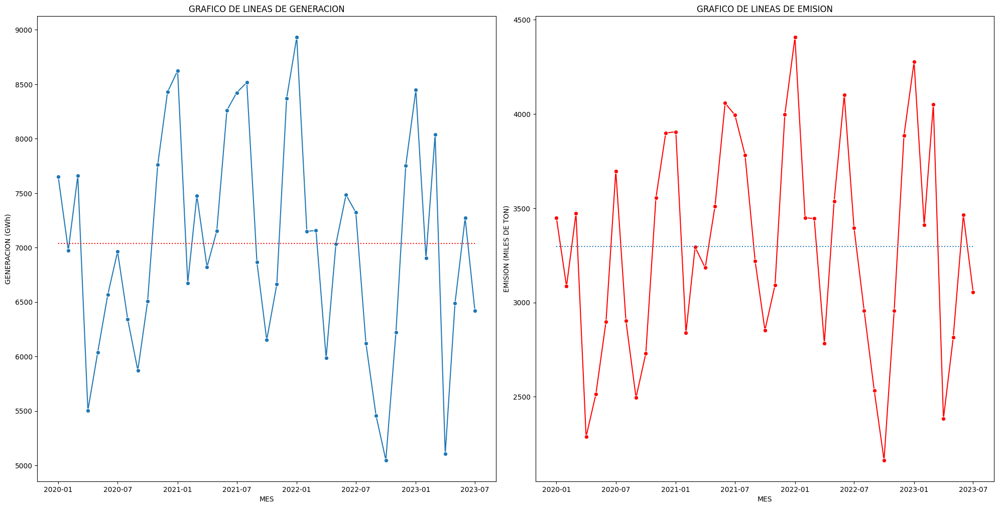

In [85]:
f, axs = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw=dict(width_ratios=[2, 2]))
sns.lineplot(data=agrup_mes, x="MES", y="GENERACION", ax=axs[0], marker = "o")
sns.lineplot(data=agrup_mes, x="MES", y=agrup_mes['GENERACION'].mean(), ax=axs[0], c="red", linestyle=":")
sns.lineplot(data=agrup_mes, x="MES", y="EMISION", ax=axs[1] , c="red", marker = "o")
sns.lineplot(data=agrup_mes, x="MES", y=agrup_mes['EMISION'].mean(), ax=axs[1], linestyle=":")
f.tight_layout()
axs[0].set_title('GRAFICO DE LINEAS DE GENERACION')
axs[1].set_title('GRAFICO DE LINEAS DE EMISION')
axs[0].set(ylabel='GENERACION (GWh)')
axs[1].set(ylabel='EMISION (MILES DE TON)')
warnings.filterwarnings('ignore')

GRAFICO 2

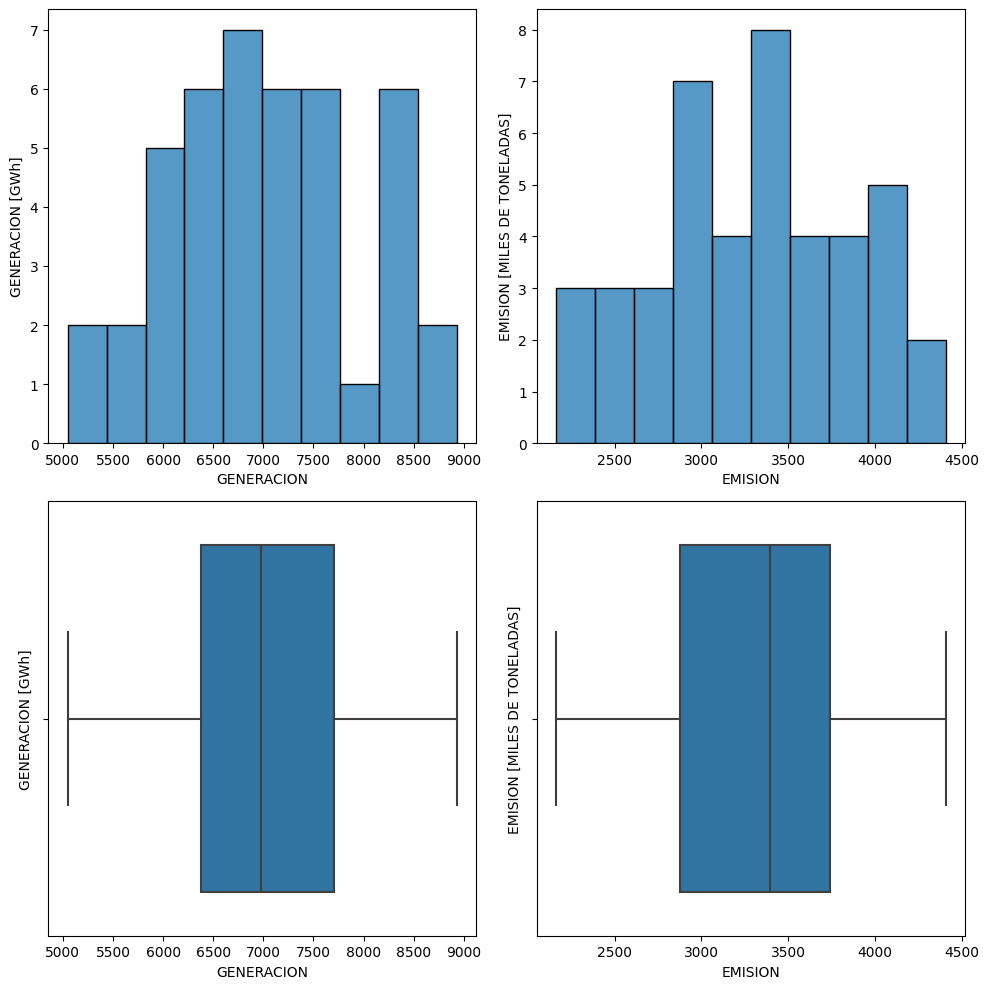

In [86]:
f, axs = plt.subplots(2, 2, figsize=(10,10), gridspec_kw=dict(width_ratios=[2,2]))
sns.histplot(data=agrup_mes, x="GENERACION", ax=axs[0,0], bins=10)
sns.boxplot(x=agrup_mes['GENERACION'], ax=axs[1,0])
sns.histplot(data=agrup_mes, x="EMISION", ax=axs[0,1], bins=10)
sns.boxplot(x=agrup_mes['EMISION'], ax=axs[1,1])
f.tight_layout()
axs[0,0].set_ylabel('GENERACION [GWh]')
axs[1,0].set_ylabel('GENERACION [GWh]')
axs[0,1].set_ylabel('EMISION [MILES DE TONELADAS]')
axs[1,1].set_ylabel('EMISION [MILES DE TONELADAS]')
warnings.filterwarnings('ignore')

GRAFICO 3

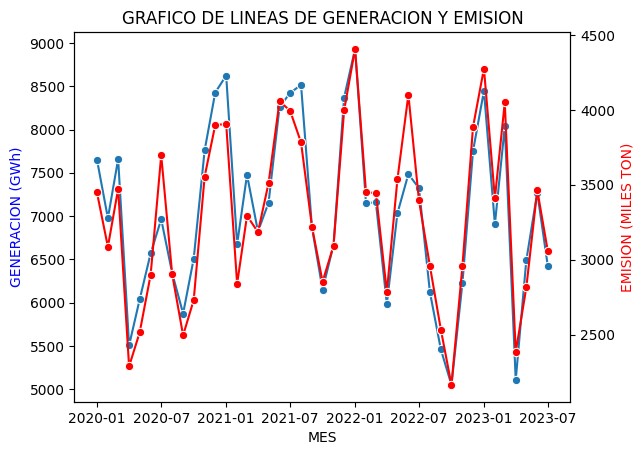

In [87]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.lineplot(data=agrup_mes, x="MES", y="GENERACION", ax=ax1, marker = "o")
sns.lineplot(data=agrup_mes, x="MES", y="EMISION", ax=ax2 , c="red", marker = "o")
ax1.set_title('GRAFICO DE LINEAS DE GENERACION Y EMISION')
ax1.set_xlabel('MES')
ax1.set_ylabel('GENERACION (GWh)', color='b')
ax2.set_ylabel('EMISION (MILES TON)', color='r')
plt.show()
warnings.filterwarnings('ignore')

2)¿La energía generada ha ido en aumento con el transcurso del tiempo? ¿Como fue el comportamiento de las emisiones como contrapartida?

De no mediar ningun hito importante en los meses que restan del 2023 y extrapolando mediante un calculo general por regla de tres, se podría estimar que en 2023 la generación rondaria los 83440 GWh y la emisión las 40200 toneladas de CO2.

Con la poca información en términos de años que se dispone, el GRAFICO 4 muestra que en los últimos 4 años no hay mayores cambios en lo generado, es decir no hay una tendencia marcada en términos de generación anual y por el lado de las emisiones habría una leve tendencia alcista al término del 2023.

GRAFICO 4

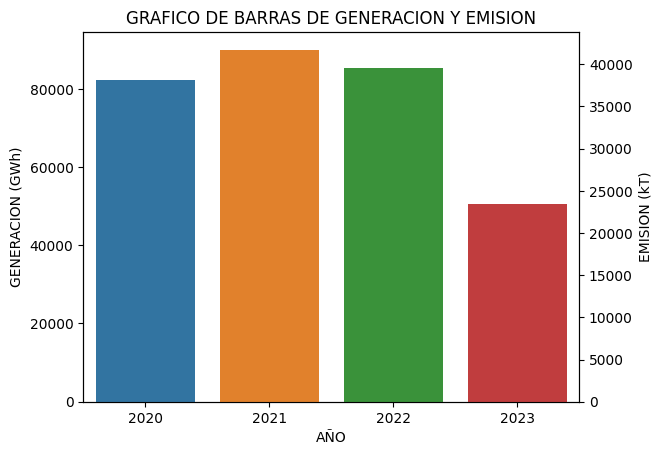

In [88]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.barplot(x=agrup_año['AÑO'], y=agrup_año['GENERACION'], data=agrup_mes, ax=ax1)
sns.barplot(x=agrup_año['AÑO'], y=agrup_año['EMISION'], data=agrup_mes, ax=ax2)
ax1.set_title('GRAFICO DE BARRAS DE GENERACION Y EMISION')
ax1.set_xlabel('AÑO')
ax1.set_ylabel('GENERACION (GWh)')
ax2.set_ylabel('EMISION (kT)')
plt.show()
warnings.filterwarnings('ignore')

In [89]:
agrup_año

,AÑO,EMISION,GENERACION
0,2020,36985.162,82263.412
1,2021,41726.275,89998.418
2,2022,39610.975,81662.408
3,2023,23453.381,48673.274


In [90]:
agrup_año[agrup_año.AÑO==2023].GENERACION/7*12, agrup_año[agrup_año.AÑO==2023].EMISION/7*12

(3    83439.898286
 Name: GENERACION, dtype: float64,
 3    40205.796
 Name: EMISION, dtype: float64)

3)¿Existe alguna relación entre las características cuantitativas?

En el GRAFICO 5, guiandose por coeficientes de correlación de pearson , se observan órdenes de correlación fuertemente positiva entre si para las variables CONSUMO, GENERACION y EMISION pero no se observa correlación alguna entre la variable EMIGEN y el resto de las variables cuantitativas. Haciendo el mismo análisis pero con spearman la variable EMIGEN muestra una correlación positiva debil con FACTORXCOMB. Este cambio de valores en el coeficiente de correlación por spearman se debe a la naturaleza de la relación entre estas variables que no sería lineal,

El GRAFICO 6 muestra la fuerte correlación positiva entre las variables GENERACION Y EMISION, el coeficiente de correlación de 0,95 del mapa de calor ya lo confirmaba y se observa que el combustible condiciona la pendiente de la curva notando que carbon mineral a priori genera más CO2 que el resto de los combustibles y que con el gas natural se genera más energía con el mismo nivel de emisión que gas oil y fuel oil.

In [91]:
df2 = df[labels_cuanti]
df2['EMIGEN'] = df2['EMISION']/df2['GENERACION'] #se crea la columna EMIGEN que es la variable que se quiere controlar

GRAFICO 5

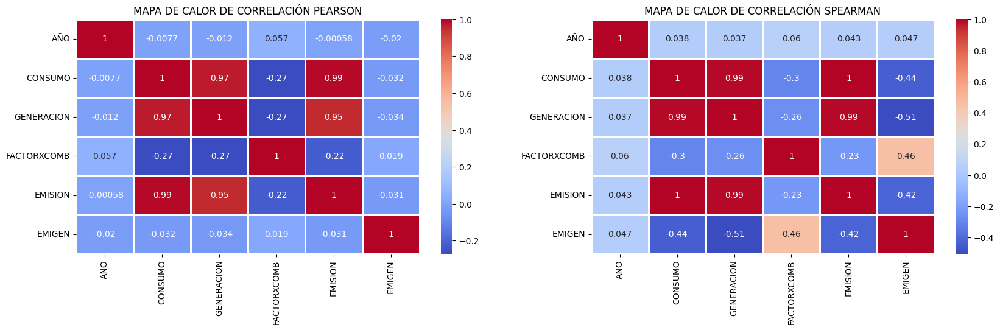

In [92]:
plt.figure(figsize=(20,5)) # Tamaño de la figura
plt.subplot(1,2,1)
heatmap = sns.heatmap(df2.corr('pearson'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN PEARSON")
plt.subplot(1,2,2)
heatmap = sns.heatmap(df2.corr('spearman'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN SPEARMAN")
plt.show()
warnings.filterwarnings('ignore')

GRAFICO 6

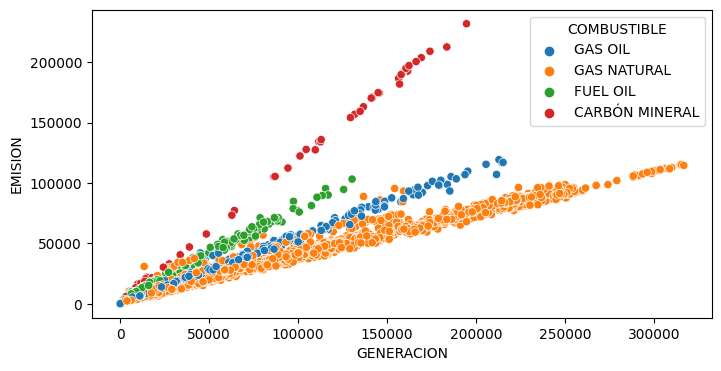

In [93]:
plt.figure(figsize=(8,4)) # Tamaño de la figura
sns.scatterplot(x='GENERACION', y='EMISION', hue='COMBUSTIBLE', data=df)
plt.show()
warnings.filterwarnings('ignore')

4)En base a los combustibles utilizados en el país, ¿existe una dependencia con alguno partícular por parte de las provincias? Y a nivel nacional como es la situación?

Se confirma que el gas natural es el combustible mayoritariamente utilizado para la generación de energía, con un 85% de participación en el total de los datos de generación (GRAFICO 7).

En cuanto a la dependencia de cada provincia con cada combustible (GRAFICO 8), lo que se observa es que muchas provincias dependen unicamente del gas oil (La Pampa, Chaco, Catamarca por ejemplo) mientras que en las que tienen más posibilidades de recursos lo más utilizado es el gas natural (Buenos Aires, Santa Fe, Mendoza por ejemplo). No todos tienen acceso al gas natural siguiendo con la lógica de la falta de inversión del país en infraestructura asociada y con respecto al carbón mineral solo dos provincias lo utilizan (Santa Cruz y Buenos Aires).

GRAFICO 7

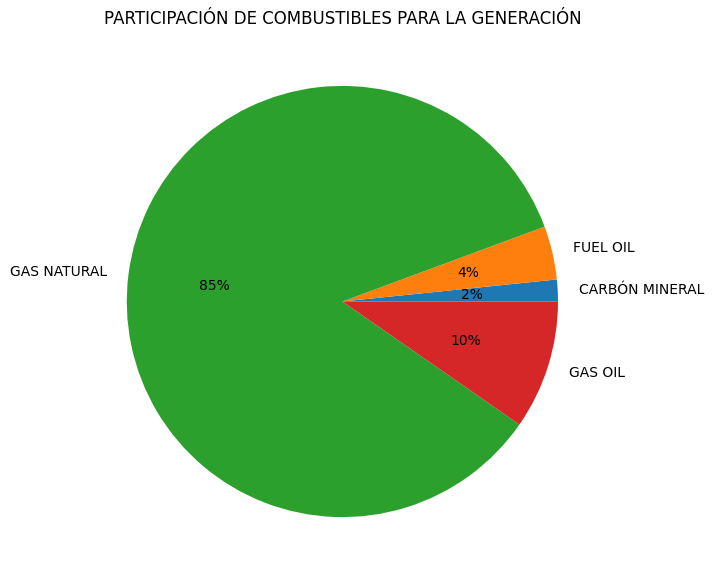

In [94]:
fig,ax = plt.subplots(figsize =(10, 7))
ax.pie(agrup_comb['GENERACION'], labels =agrup_comb.index, autopct='%1.f%%')
ax.set_title('PARTICIPACIÓN DE COMBUSTIBLES PARA LA GENERACIÓN')
warnings.filterwarnings('ignore')

GRAFICO 8

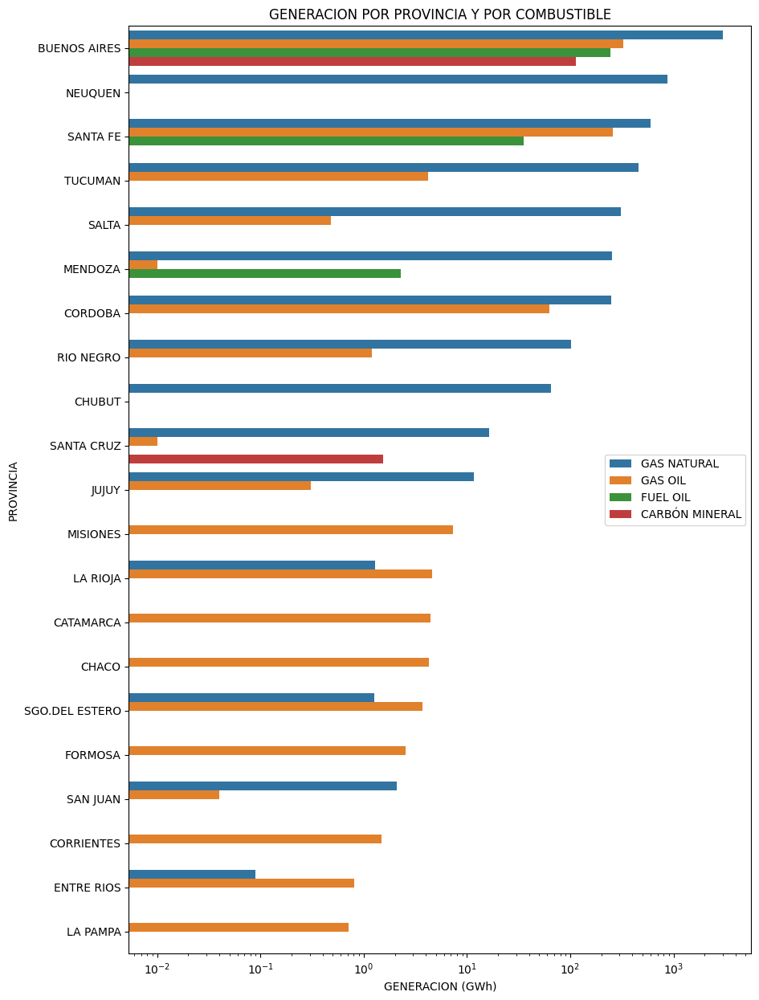

In [95]:
f, axs = plt.subplots(1,1, figsize=(10, 15))
sns.barplot(x=agrup_provcomb['GENERACION'], y=agrup_provcomb['PROVINCIA'], hue=agrup_provcomb['COMBUSTIBLE'], )
axs.set_title('GENERACION POR PROVINCIA Y POR COMBUSTIBLE')
axs.set(ylabel='PROVINCIA')
axs.set(xlabel='GENERACION (GWh)')
axs.legend(loc="center right")
axs.set_xscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.
warnings.filterwarnings('ignore')

5)¿Como es el comportamiento mensual en términos de generación y emisión de cada provincia? Se observan hitos en algún mes puntual a lo largo de la historia?

Con los GRAFICOS 9 y 11 la idea es visualizar como fue el comportamiento de las variables a lo largo de los meses de los cuales se tienen datos. En general pareciera haber ciertos comportamientos estacionales propios de las temperaturas ya que en función de como sea la integración/dependencia de los usuarios a la energía eléctrica podría suponer la necesidad de generar mas energía en los meses de verano para algunas provincias y lo mismo para los meses de invierno en otras provincias. De cualquier forma la fuerte correlación entre la emisión y la generación también queda manifestada en estos gráficos.

En los casos de las provincias de Buenos Aires, La Pampa, Córdoba, Santa Fe, Corrientes y Entre Rios se observan picos de generación en los meses de Verano e Invierno mientras que en los meses restantes el comportamiento es inverso. Se observa que en general en Verano es necesario generar mas energía que en invierno salvo en las provincias de Entre Rios y Santa Fe donde parecería ser mas alta la necesidad en Invierno. Esto último siempre hablando dentro de cada provincia en particular dado que los órdenes de los valores entre provincias son dispares.

Por otro lado para las provincias de Misiones, Chaco, Mendoza, La Rioja, San Juan, Catamarca, Santiago del Estero, Tucumán, Jujuy y Formosa la situación es mas demandante en Verano y es consistente dado que suelen manifestarse temperaturas más elevadas que la media del país durante todo el año y máximos en los meses de Enero y Diciembre.

Salta, Neuquén y Río Negro por su parte tienen un patrón con una cierta estabilidad sin picos marcados.

Lo que se observa claro en el GRAFICO 10, salvo algunas excepciones, es que los meses primaverales de septiembre/octubre y los meses otoñales de abril/mayo parecen ser lo más tranquilos en términos de necesidades, es decir órdenes bajos de generación para cada provincia particular.

En los gráficos también se visualiza variabilidad en los valores de cada provincia, y en algunos casos sera necesario evaluar si no se trata de outliers como por ejemplo Septiembre 2021 para el caso de Salta, Noviembre 2022 para el caso de Rio Negro, Mayo 2020 para Mendoza o Julio 2020 para Neuquén. Esto se puede visualizar mas claramente en el GRAFICO 9.

Los GRAFICOS 11 y 12 permiten evaluar a lo largo del tiempo como fue el comportamiento de las provincias en términos relativos a la emisión por unidad de energía generada (variable EMIGEN) y acá ya se observa a priori lo que se intentará responder en la pregunta siguiente de cual provincia es la mas eficiente. Por los valores de la variable, Salta parece ser la provincia en consideración con valores en torno a los 0,39 en general (debajo de las medianas de las demás provincias) para todos meses. En Enero 2022 habrá que chequear la existencia de outlier ya que hay un pico muy marcado lo cual no se corresponde con las mediciones normales para el resto de los meses.

GRAFICO 9

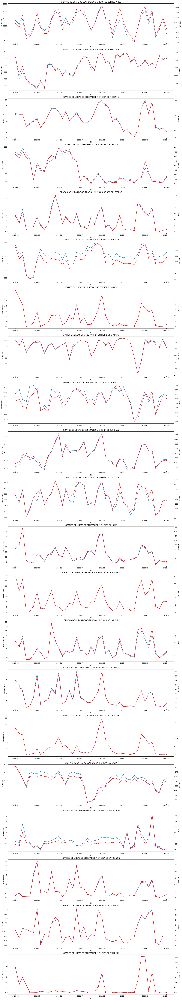

In [96]:
PROVINCIAS = df1.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  ax1 = plt.subplot(len(PROVINCIAS),1,i+1)
  ax2 = ax1.twinx()
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].GENERACION, ax=ax1, marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMISION, ax=ax2, c="red", marker = "o")
  plt.title('GRAFICO DE LINEAS DE GENERACION Y EMISION DE '+j)
  plt.xlabel('')

GRAFICO 10

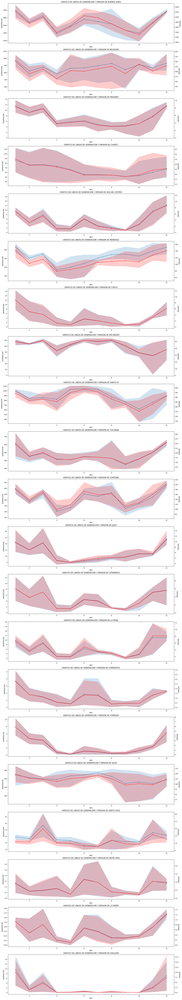

In [97]:
PROVINCIAS = df1.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  ax1 = plt.subplot(len(PROVINCIAS),1,i+1)
  ax2 = ax1.twinx()
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].GENERACION, ax=ax1, marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMISION, ax=ax2, c="red", marker = "o")
  plt.title('GRAFICO DE LINEAS DE GENERACION Y EMISION DE '+j)
  plt.xlabel('')

GRAFICO 11

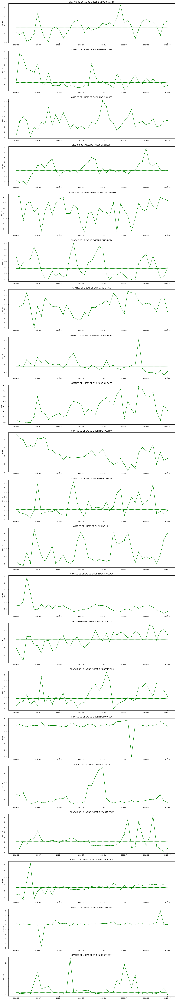

In [98]:
PROVINCIAS = df.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  plt.subplot(len(PROVINCIAS),1,i+1)
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN, c="green", marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN.median(), c="green", linestyle="--")
  plt.title('GRAFICO DE LINEAS DE EMIGEN DE '+j)
  plt.xlabel('')

GRAFICO 12

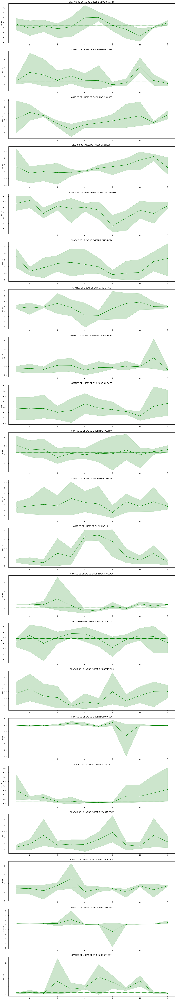

In [99]:
PROVINCIAS = df.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  plt.subplot(len(PROVINCIAS),1,i+1)
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN, c="green", marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN.median(), c="green", linestyle="--")
  plt.title('GRAFICO DE LINEAS DE EMIGEN DE '+j)
  plt.xlabel('')

6)¿Cual es la provincia que más genera y emite en términos absolutos? Y ¿cual es la que menos lo hace? Se puede anticipar en base a los datos cual es la mas eficiente?

Para continuar se intentará determinar cual es la provincia que genera menor contaminación por unidad de energía generada. Es decir que es mas eficiente. Para ello en base al GRAFICO 13, se ordenó a las provincias de menor a mayor en función de su relación de Toneladas de CO2 por GWh generado por mes. A partir de aquí se visualiza en principio lo mencionado antes que Salta es la provincia más eficiente y por otro lado en el GRAFICO 14 se observa que Buenos Aires es la provincia que mas energía genera pero así también la que mas contamina en términos absolutos.

GRAFICO 13

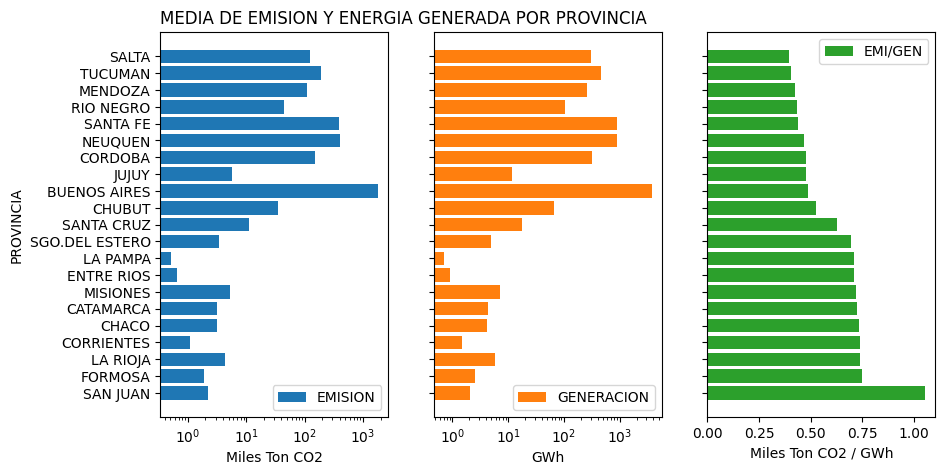

In [100]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), sharex=False, sharey=True)
ax[0].barh(agrup_prov.index, agrup_prov['EMISION'], label='EMISION')
ax[1].barh(agrup_prov.index, agrup_prov['GENERACION'], label='GENERACION', color='C1')
ax[2].barh(agrup_prov.index, agrup_prov['EMISION/GENERACION'], label='EMI/GEN', color='C2')
ax[0].set_title('MEDIA DE EMISION Y ENERGIA GENERADA POR PROVINCIA', loc='left')
ax[2].set_xlabel('Miles Ton CO2 / GWh')
ax[1].set_xlabel('GWh')
ax[0].set_xlabel('Miles Ton CO2')
ax[0].set_ylabel('PROVINCIA')
ax[2].legend()
ax[0].legend()
ax[1].legend()
ax[0].set_xscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.
ax[1].set_xscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.

GRAFICO 14

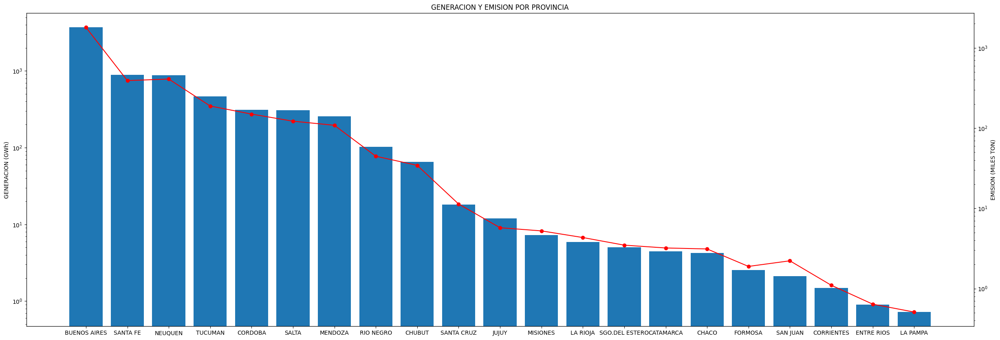

In [101]:
y= agrup_prov.sort_values(by =['GENERACION'], ascending=False)
fig,ax = plt.subplots(figsize =(30, 10))
ax1 = ax.twinx()
ax.bar(y.index, y['GENERACION'])
ax1.plot(y.index, y['EMISION'], c="r", marker="o")
ax1.set_title('GENERACION Y EMISION POR PROVINCIA')
ax.set_ylabel('GENERACION (GWh)')
ax1.set_ylabel('EMISION (MILES TON)')
ax.set_yscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.
ax1.set_yscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.

7)Se pueden identificar valores atípicos/anormales en los datos disponibles que puedan generar algún tipo de distorsión?

Para analizar la existencia de outliers o valores anomalos se utilizaron dos procedimientos. Primero se normalizaron los datos de las variables cuantitativas y se utilizó la medida de cálculo zscore para determinar en función de su valor si la variable EMIGEN presenta valores atípicos. Los cálculos con este enfoque determinaron que la cantidad de outliers sobre el total de registros disponibles es despreciable (0,22%). Seguido a esto, con los valores normalizados también, se aplicó otro enfoque mediante diferencias euclideanas haciendo el análisis en forma multivariada. Para este caso, la proporción de outliers resultó 4,6% siendo aún poco significantiva. En base a este ultimo enfoque se decidió eliminar estos registros dejando el datasets totalmente depurado.

In [102]:
df['EMIGEN'] = df['EMISION']/df['GENERACION'] #se crea la columna EMIGEN en el datasets depurado

In [103]:
data_z = pd.DataFrame()

In [104]:
for j in df.columns[12:]:
  data_z[j] = (df[j] - df[j].mean()) / df[j].std() #calculo de zscore para variables cuantitativas
data_z.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,EMIGEN
0,-0.429767,-0.407161,0.744932,-0.435527,-0.018314
1,-0.415043,-0.396103,0.744932,-0.416215,-0.016814
2,0.846424,0.589472,-0.943478,0.771957,-0.069277
3,0.801788,0.699563,-0.943478,0.729670,-0.084993
4,0.795687,0.698763,-0.943478,0.723891,-0.085434


In [105]:
# definición si un registro es outliers en funcion del valor de zcore de EMIGEN
data_z['EMIGEN_x']= data_z['EMIGEN'].apply(lambda x: 'Atipico' if (x>2 or x<-2) else 'Normal')
data_z.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,EMIGEN,EMIGEN_x
0,-0.429767,-0.407161,0.744932,-0.435527,-0.018314,Normal
1,-0.415043,-0.396103,0.744932,-0.416215,-0.016814,Normal
2,0.846424,0.589472,-0.943478,0.771957,-0.069277,Normal
3,0.801788,0.699563,-0.943478,0.729670,-0.084993,Normal
4,0.795687,0.698763,-0.943478,0.723891,-0.085434,Normal


In [106]:
data_z['EMIGEN_x'].value_counts(), round(data_z['EMIGEN_x'].value_counts()/len(data_z.index)*100,2) #cantidad y proporcion de outliers

(EMIGEN_x
 Normal     15929
 Atipico       35
 Name: count, dtype: int64,
 EMIGEN_x
 Normal     99.78
 Atipico     0.22
 Name: count, dtype: float64)

In [107]:
labels_cuanti= ["CONSUMO","GENERACION", "FACTORXCOMB", "EMISION", "EMIGEN", "EMIGEN_x"]

GRAFICO 15

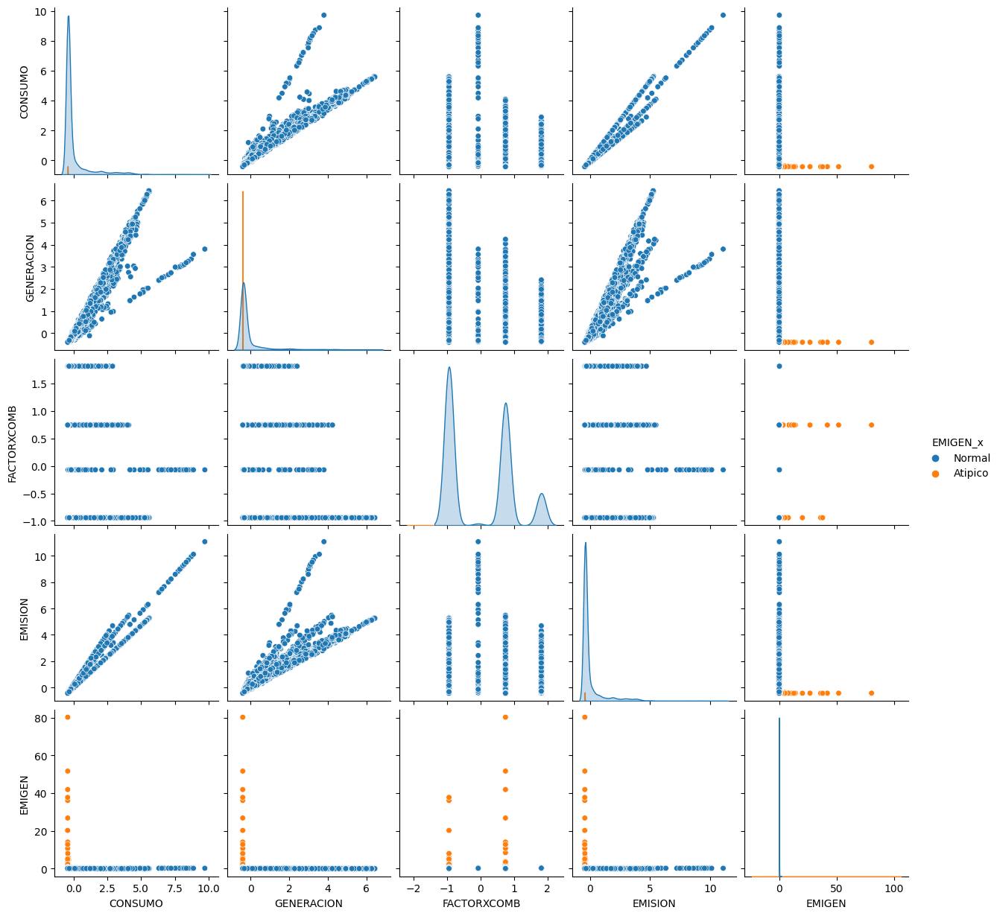

In [108]:
sns.pairplot(data_z[labels_cuanti], hue='EMIGEN_x', plot_kws = {'s': 30})
# se grafican los outilers identificados mediante el valor de zcore.
plt.show()
plt.close('all')
warnings.filterwarnings('ignore')

In [109]:
data_multiple=data_z.drop(columns=['EMIGEN_x'])
data_multiple.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,EMIGEN
0,-0.429767,-0.407161,0.744932,-0.435527,-0.018314
1,-0.415043,-0.396103,0.744932,-0.416215,-0.016814
2,0.846424,0.589472,-0.943478,0.771957,-0.069277
3,0.801788,0.699563,-0.943478,0.729670,-0.084993
4,0.795687,0.698763,-0.943478,0.723891,-0.085434


In [110]:
def outlier_euclideano_d(x,cutoff): # x: dataframe con valores numericos normalizados
  result_ = pd.Series([0] * len(x), index=x.index) #valor 0 por default para datos normales
  data_mean = x.mean() # media de los datos_
  dist = np.sqrt(np.sum(((x-data_mean) ** 2),axis=1)) #Distancia euclideana
  dist_mean = dist.mean() #media de las distancia
  dist_zscore = np.abs((dist - dist_mean) / dist.std())#z-score para las distancias
  result_[((dist_zscore > cutoff))] = 1 #se identifica con 1 los valores outliers
  return result_

In [111]:
euc_d = data_multiple.copy()
euc_d

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,EMIGEN
0,-0.429767,-0.407161,0.744932,-0.435527,-0.018314
1,-0.415043,-0.396103,0.744932,-0.416215,-0.016814
2,0.846424,0.589472,-0.943478,0.771957,-0.069277
3,0.801788,0.699563,-0.943478,0.729670,-0.084993
4,0.795687,0.698763,-0.943478,0.723891,-0.085434
...,...,...,...,...,...
16371,2.204365,2.517227,-0.943478,2.058393,-0.104930
16372,0.946602,1.030922,0.744932,1.369644,-0.065001
16373,2.008669,2.278350,-0.943478,1.873001,-0.104246
16374,1.235963,1.344205,0.744932,1.749153,-0.065796


In [112]:
# Aplicar la funcion
euc_d['outlier']=outlier_euclideano_d(euc_d,2)
euc_d.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,EMIGEN,outlier
0,-0.429767,-0.407161,0.744932,-0.435527,-0.018314,0
1,-0.415043,-0.396103,0.744932,-0.416215,-0.016814,0
2,0.846424,0.589472,-0.943478,0.771957,-0.069277,0
3,0.801788,0.699563,-0.943478,0.729670,-0.084993,0
4,0.795687,0.698763,-0.943478,0.723891,-0.085434,0


GRAFICO 16

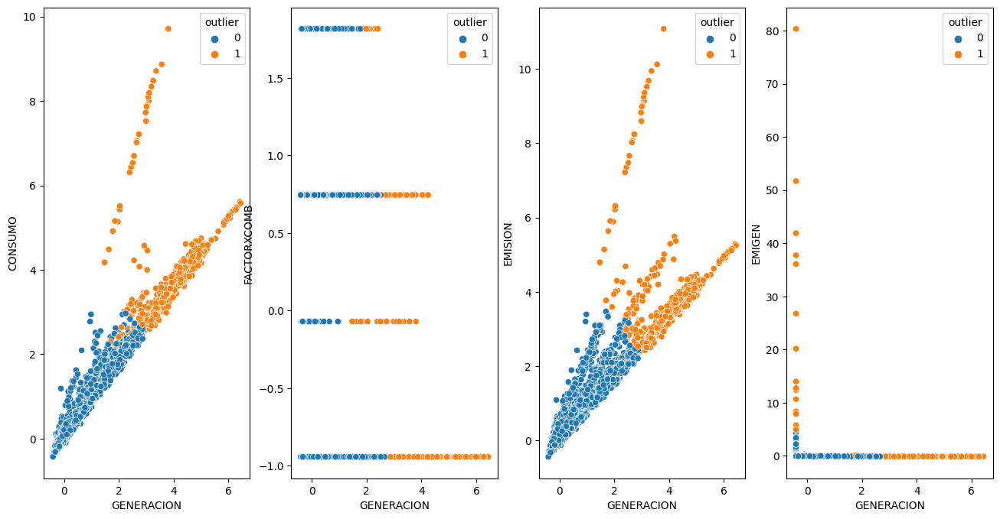

In [113]:
plt.figure(figsize=(16,8))
plt.subplot(1,4,1)
sns.scatterplot(x="GENERACION",y="CONSUMO",data=euc_d,hue="outlier")
plt.subplot(1,4,2)
sns.scatterplot(x="GENERACION",y="FACTORXCOMB",data=euc_d,hue="outlier")
plt.subplot(1,4,3)
sns.scatterplot(x="GENERACION",y="EMISION",data=euc_d,hue="outlier")
plt.subplot(1,4,4)
sns.scatterplot(x="GENERACION",y="EMIGEN",data=euc_d,hue="outlier")
warnings.filterwarnings('ignore')

In [114]:
euc_d['outlier'].value_counts(), round(euc_d['outlier'].value_counts()/len(euc_d.index)*100,2) #cantidad y proporcion de outliers

(outlier
 0    15232
 1      732
 Name: count, dtype: int64,
 outlier
 0    95.41
 1     4.59
 Name: count, dtype: float64)

In [115]:
indicesatip = euc_d[euc_d.outlier==1].index #se determinan los indices de los registros con valores atipicos

In [116]:
print(df.shape)
dflimpio=df.drop(indicesatip, axis=0) #se eliminan en el dataset depurado de valores incorrectos los registros con valores atipicos calculados por dist euclidea.
print(dflimpio.shape)

(15964, 17)
(15232, 17)


In [117]:
dflimpio

,AÑO,MES,MAQUINA,CENTRAL,AGENTE,AGENTE DESCRIPCION,REGION,PROVINCIA,TIPOMAQ,FUENTEGEN,TECNOLOGIA,COMBUSTIBLE,CONSUMO,GENERACION,FACTORXCOMB,EMISION,EMIGEN
0,2020,2020-01-01,9JULDI01,9JUL,CMOREN1G,COOP. MNO. MORENO BS. AS.GENER,BUENOS AIRES,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,40.544,145.245,2.697171,109.354083,0.752894
1,2020,2020-01-01,ABRODI01,ABRO,CTBROWNG,C.T. ALMIRANTE BROWN,GRAN BS.AS.,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,184.748,656.097,2.697171,498.296865,0.759487
2,2020,2020-01-01,ACAJCC01,CAPE,CAPEX-QA,CAPEX S.A. AUTOGENERADOR,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12538.960,46187.020,1.948196,24428.350713,0.528901
3,2020,2020-01-01,ACAJCC02,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12101.809,51272.911,1.948196,23576.694918,0.459828
4,2020,2020-01-01,ACAJCC03,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12042.061,51235.952,1.948196,23460.294109,0.457887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16371,2023,2023-07-01,EBARCC02,EBAR,CTBARRAG,CT BARRAGAN - ENARSA,GRAN BS.AS.,BUENOS AIRES,CICLO COMBINADO,Térmica,CC,GAS NATURAL,25837.990,135244.126,1.948196,50337.466699,0.372197
16372,2023,2023-07-01,EBARCC02,EBAR,CTBARRAG,CT BARRAGAN - ENARSA,GRAN BS.AS.,BUENOS AIRES,CICLO COMBINADO,Térmica,CC,GAS OIL,13520.056,66580.812,2.697171,36465.896908,0.547694
16373,2023,2023-07-01,EBARCC01,EBAR,CTBARRAG,CT BARRAGAN - ENARSA,GRAN BS.AS.,BUENOS AIRES,CICLO COMBINADO,Térmica,CC,GAS NATURAL,23921.432,124208.650,1.948196,46603.636223,0.375204
16374,2023,2023-07-01,EBARCC01,EBAR,CTBARRAG,CT BARRAGAN - ENARSA,GRAN BS.AS.,BUENOS AIRES,CICLO COMBINADO,Térmica,CC,GAS OIL,16353.917,81053.657,2.697171,44109.303347,0.544199


In [118]:
labels_cuanti= ["CONSUMO","GENERACION", "FACTORXCOMB", "EMISION", "EMIGEN"]

GRAFICO 17

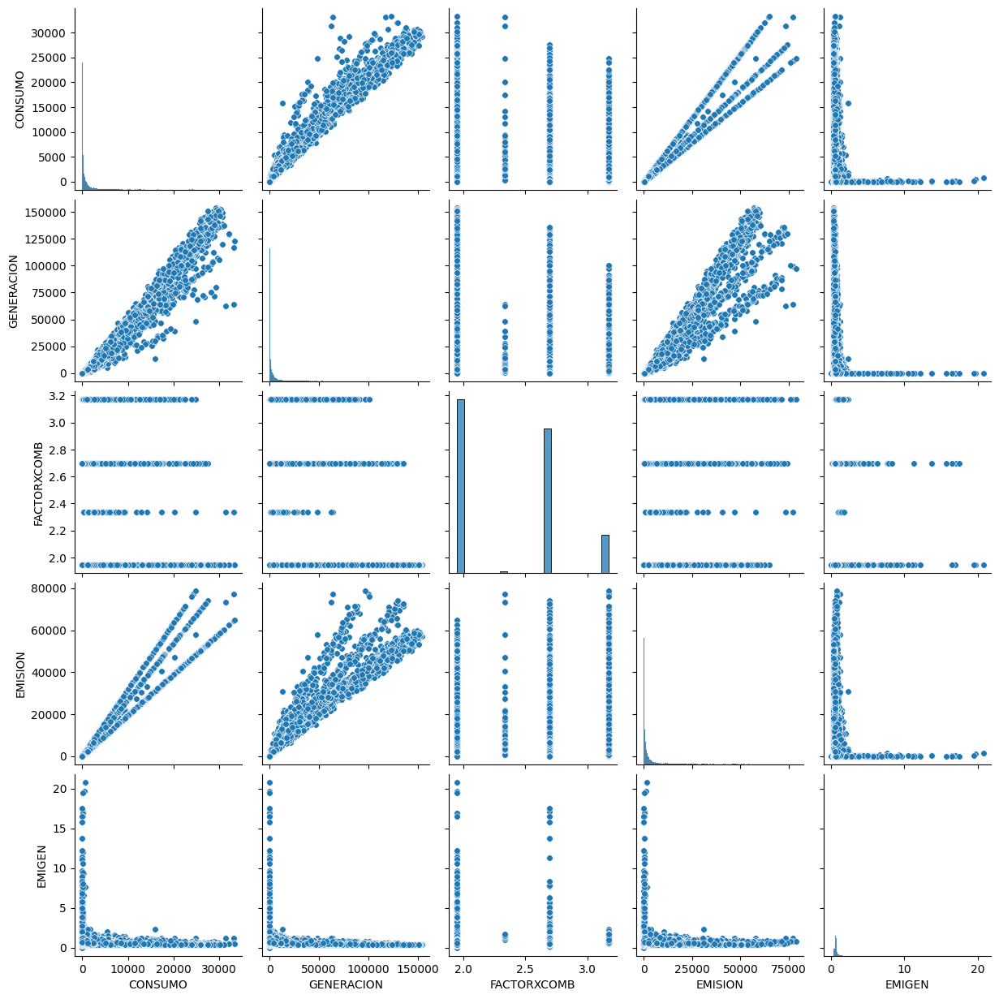

In [119]:
sns.pairplot(dflimpio[labels_cuanti], plot_kws = {'s': 30})
# se grafican nuevamente los varoles ya con los outliers depurados.
plt.show()
plt.close('all')
warnings.filterwarnings('ignore')

GRAFICO 18

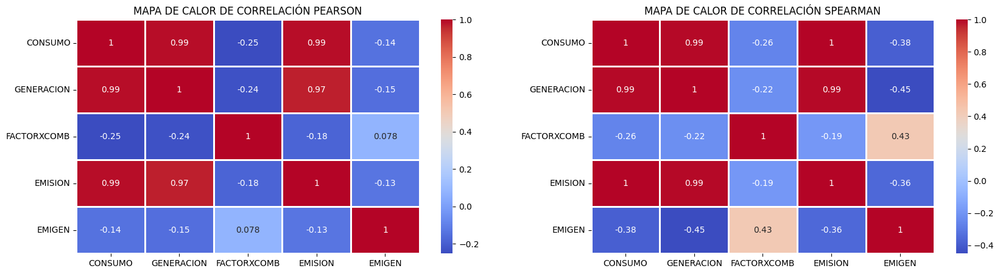

In [120]:
plt.figure(figsize=(20,5)) 
plt.subplot(1,2,1)
heatmap = sns.heatmap(dflimpio[labels_cuanti].corr('pearson'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN PEARSON")
plt.subplot(1,2,2)
heatmap = sns.heatmap(dflimpio[labels_cuanti].corr('spearman'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN SPEARMAN")
plt.show() #se vuelven a graficar los valores de correlación de pearson y spearman sobre el datasets depurado de outliers.
warnings.filterwarnings('ignore')

##### **Insights**

Del análisis exploratorio de datos se pueden resumir los siguientes hallazgos:

-A lo largo y ancho del país existe una fuerte dependencia hacía la explotación de energías no renovables para la generación de energía eléctrica lo cual no ayuda a ser sustentable en términos medioambientales.

-El gas natural es el combustible más utilizado (85%) para la generación de energía.

-De las 24 provincias argentinas, 21 aportan al sistema interconectado, es decir más del 85% de las provincias participan en la generación de energía, no concentrando todo el esfuerzo en un solo sector del territorio.

-Excasa presencia de valores atípicos en las mediciones y perfecta disponibilidad de datos.

-No hubo crecimiento de la generación en los últimos años y una leve tendencia positiva en las emisiones.

-Fuerte correlación positiva entre la variable generación y la variable emisión. Es decir que si crece la generación también lo hacen las emisiones. La variable consumo, que también tiene fuerte correlación positiva con las anteriores se puede despreciar ya que podría explicarse a través de las anteriores.

-El combustible utilizado para la generación condiciona la pendiente de la correlación anterior, siendo mas sustentable con el gas natural y menos sustentable el carbon mineral. Es decir, para un determinado nivel de generación se consiguen menos emisiones con gas natural que con el resto.

-Durante el año se ve marcada la estacionalidad en los datos. En general se observan picos de generación en los meses de Verano e Invierno mientras que en los meses restantes el comportamiento es inverso.

-Los meses primaverales de septiembre/octubre y los meses otoñales de abril/mayo son los más tranquilos en términos de necesidades, es decir órdenes bajos de generación para cada provincia particular.

-Salta es las provincia más sustentable y San Juan es la menos eficiente.